In [27]:
import pathlib
import asdf
import astropy.units as u
import astropy.table
import sunpy.map

import eispac
import eispac.data
import eispac.core

from correct_eis_pointing import fix_eis_pointing

# Fit EIS Lines

In [5]:
selected_lines = astropy.table.Table.read('../data/tables/selected_eis_lines.asdf')

In [13]:
selected_lines

Element,Z,Ion,Wavelength,Template,Number Gaussians,Included lines
,,,Angstrom,,,
str2,int64,int64,float64,str28,int64,str89
Si,14,7,275.368,si_07_275_368.3c.template.h5,3,"Si VII 275.368, unknown I 275.553, Si VII 275.665"
Si,14,10,258.375,si_10_258_375.1c.template.h5,1,Si X 258.375
S,16,10,264.233,s__10_264_233.1c.template.h5,1,S X 264.233
S,16,13,256.686,s__13_256_686.1c.template.h5,1,S XIII 256.686
Ca,20,14,193.874,ca_14_193_874.6c.template.h5,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396"
Ca,20,15,200.972,ca_15_200_972.2c.template.h5,2,"Ca XV 200.972, Fe XIII 201.121"
Ca,20,16,208.604,ca_16_208_604.2c.template.h5,2,"Ca XVI 208.604, Fe XIII 208.679"
Ca,20,17,192.858,ca_17_192_858.1c.template.h5,1,Ca XVII 192.858


In [6]:
observation_table = astropy.table.Table.read('../data/tables/mason_ars_region_1.asdf')

In [8]:
root_dir = pathlib.Path('../data')

In [9]:
observation_table

NOAA AR,Comment,Date start,Date end,Date mid,bottom left,top right,EIS file
,,,,,arcsec,arcsec,
int64,str80,Time,Time,Time,float64[2],float64[2],str19
11944,Adjusted start time to avoid flare on 2014-01-07 18:00:00,2014-01-08T06:00:00.000,2014-01-08T18:00:00.000,2014-01-08T12:00:00.000,-200.0 .. -330.0,330.0 .. 100.0,eis_20140108_095727
11967,Adjusted start time to center interval on EIS raster scan,2014-02-03T05:00:00.000,2014-02-03T17:00:00.000,2014-02-03T11:00:00.000,-278.0 .. -300.0,260.0 .. 100.0,eis_20140203_093134
11990,Adjusted start time to avoid eclipse on 2014-03-02 06:00:00,2014-03-01T18:00:00.000,2014-03-02T06:00:00.000,2014-03-02T00:00:00.000,-350.0 .. -350.0,150.0 .. 0.0,eis_20140302_000659


In [12]:
for line in selected_lines:
    template = eispac.read_template(eispac.data.get_fit_template_filepath(line['Template']))
    print(template)
    for row in observation_table:
        print(row['NOAA AR'])
        eis_dir = root_dir / f'noaa_{row["NOAA AR"]}' / 'EIS'
        cube = eispac.read_cube(eis_dir / 'level_1' / f'{row["EIS file"]}.data.h5',
                                window=template.central_wave)
        fit_res = eispac.fit_spectra(cube, template, ncpu='max')
        _ = eispac.export_fits(fit_res, save_dir=eis_dir / 'level_2')

--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/si_07_275_368.3c.template.h5
n_gauss: 3
n_poly: 1
line_ids: ['Si VII 275.368' 'unknown I 275.553' 'Si VII 275.665']
wmin, wmax: 275.1679992675781, 275.79998779296875

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]      1462.5516       0     1     0       0.0000       0.0000                   
  p[1]       275.3678       0     1     1     275.3009     275.4347                   
  p[2]         0.0388       0     1     1       0.0191       0.0510                   
  p[3]      1101.6456       0     1     0       0.0000       0.0000                   
  p[4]       275.5531       0     1     1     275.4862     275.6200                   
  p[5]         0.0486       0     1     1       0.0191       0.0510                   
  p[6]       344.9759       0     1     0       0.0000

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 108

Finished computing fits!
   runtime : 0:02:35.327076
   44295 spectra fit without issues
   17145 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.si_07_275_368.3c-0.int.fits
              eis_20140203_093134.si_07_275_368.3c-0.vel.fits
              eis_20140203_093134.si_07_275_368.3c-0.wid.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.int.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.vel.fits
              eis_20140203_093134.unknown_01_275_553.3c-1.wid.fits
              eis_20140203_093134.si_07_275_665.3c-2.int.fits
              eis_20140203_093134.si_07_275_665.3c-2.vel.fits
              eis_20140203_093134.si_07_275_665.3c-2.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EI

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:35.518152
   12000 spectra fit without issues
   0 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.si_07_275_368.3c-0.int.fits
              eis_20140302_000659.si_07_275_368.3c-0.vel.fits
              eis_20140302_000659.si_07_275_368.3c-0.wid.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.int.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.vel.fits
              eis_20140302_000659.unknown_01_275_553.3c-1.wid.fits
              eis_20140302_000659.si_07_275_665.3c-2.int.fits
              eis_20140302_000659.si_07_275_665.3c-2.vel.fits
              eis_20140302_000659.si_07_275_665.3c-2.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:16.167099
   47265 spectra fit without issues
   14175 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.si_10_258_375.1c-0.int.fits
              eis_20140203_093134.si_10_258_375.1c-0.vel.fits
              eis_20140203_093134.si_10_258_375.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/s__10_264_233.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 258.39500427246094 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:21.321111
   61427 spectra fit without issues
   13 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.s__10_264_233.1c-0.int.fits
              eis_20140108_095727.s__10_264_233.1c-0.vel.fits
              eis_20140108_095727.s__10_264_233.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 264.17 [Angst

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 108

Finished computing fits!
   runtime : 0:00:16.151114
   45704 spectra fit without issues
   15736 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.s__10_264_233.1c-0.int.fits
              eis_20140203_093134.s__10_264_233.1c-0.vel.fits
              eis_20140203_093134.s__10_264_233.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY --

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 264.17149353027344 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:18.337851
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.s__13_256_686.1c-0.int.fits
              eis_20140108_095727.s__13_256_686.1c-0.vel.fits
              eis_20140108_095727.s__13_256_686.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 256.66 [Angstr

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:06.432936
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.s__13_256_686.1c-0.int.fits
              eis_20140302_000659.s__13_256_686.1c-0.vel.fits
              eis_20140302_000659.s__13_256_686.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/ca_14_193_874.6c.template.h5
n_gauss: 6
n_poly: 1
line_ids: ['Fe X 193.715' 'Ca XIV 193.874' 'Ni XVI 194.046' 'Ar XI 194.104'
 'Mn X 194.327' 'Ar XIV 194.396']
wmin, wmax: 193.60000610351562, 194.60000610351562

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]      3058.9379       0   

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 194.10000610351562 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/ca_15_200_972.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Ca XV 200.972' 'Fe XIII 201.121']
wmin, wmax: 200.80999755859375, 201.27999877929688

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     11126.3239       0     1     0       0.0000       0.0000                   
  p[1]       200.9878       0     1     1     200.9476     201.0279                   
  p[2]         0.0375       0     1     1       0.0191       0.0510                   
  p[3]     25137.8375       0     1     0   

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:25.456543
   46077 spectra fit without issues
   15363 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.ca_15_200_972.2c-0.int.fits
              eis_20140203_093134.ca_15_200_972.2c-0.vel.fits
              eis_20140203_093134.ca_15_200_972.2c-0.wid.fits
              eis_20140203_093134.fe_13_201_121.2c-1.int.fits
              eis_20140203_093134.fe_13_201_121.2c-1.vel.fits
              eis_20140203_093134.fe_13_201_121.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SU

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 201.0449981689453 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:58.244248
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.ca_16_208_604.2c-0.int.fits
              eis_20140108_095727.ca_16_208_604.2c-0.vel.fits
              eis_20140108_095727.ca_16_208_604.2c-0.wid.fits
              eis_20140108_095727.fe_13_208_679.2c-1.int.fits
              eis_20140108_095727.fe_13_208_679.2c-1.vel.fits
              eis_20140108_095727.fe_13_208_679.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_09313

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 208.67200469970703 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 117

Finished computing fits!
   runtime : 0:00:25.024861
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.ca_17_192_858.1c-0.int.fits
              eis_20140108_095727.ca_17_192_858.1c-0.vel.fits
              eis_20140108_095727.ca_17_192_858.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 192.95 [Angstr

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:07.368788
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.ca_17_192_858.1c-0.int.fits
              eis_20140302_000659.ca_17_192_858.1c-0.vel.fits
              eis_20140302_000659.ca_17_192_858.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_09_188_497.3c.template.h5
n_gauss: 3
n_poly: 1
line_ids: ['Fe IX 188.497' 'S XI 188.675' 'Ar XI 188.806']
wmin, wmax: 188.39999389648438, 188.9499969482422

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]       202.6891       0     1     0       0.0000       0.0000                 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero 

 + working on exposure 117

Finished computing fits!
   runtime : 0:01:21.256023
   59829 spectra fit without issues
   1611 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_09_188_497.3c-0.int.fits
              eis_20140108_095727.fe_09_188_497.3c-0.vel.fits
              eis_20140108_095727.fe_09_188_497.3c-0.wid.fits
              eis_20140108_095727.s__11_188_675.3c-1.int.fits
              eis_20140108_095727.s__11_188_675.3c-1.vel.fits
              eis_20140108_095727.s__11_188_675.3c-1.wid.fits
              eis_20140108_095727.ar_11_188_806.3c-2.int.fits
              eis_20140108_095727.ar_11_188_806.3c-2.vel.fits
              eis_20140108_095727.ar_11_188_806.3c-2.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)


/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: invalid value encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero e

 + working on exposure 108

Finished computing fits!
   runtime : 0:01:03.210058
   45273 spectra fit without issues
   16167 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_09_188_497.3c-0.int.fits
              eis_20140203_093134.fe_09_188_497.3c-0.vel.fits
              eis_20140203_093134.fe_09_188_497.3c-0.wid.fits
              eis_20140203_093134.s__11_188_675.3c-1.int.fits
              eis_20140203_093134.s__11_188_675.3c-1.vel.fits
              eis_20140203_093134.s__11_188_675.3c-1.wid.fits
              eis_20140203_093134.ar_11_188_806.3c-2.int.fits
              eis_20140203_093134.ar_11_188_806.3c-2.vel.fits
              eis_20140203_093134.ar_11_188_806.3c-2.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_2

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:20.121854
   12000 spectra fit without issues
   0 spectra have < 10 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_09_188_497.3c-0.int.fits
              eis_20140302_000659.fe_09_188_497.3c-0.vel.fits
              eis_20140302_000659.fe_09_188_497.3c-0.wid.fits
              eis_20140302_000659.s__11_188_675.3c-1.int.fits
              eis_20140302_000659.s__11_188_675.3c-1.vel.fits
              eis_20140302_000659.s__11_188_675.3c-1.wid.fits
              eis_20140302_000659.ar_11_188_806.3c-2.int.fits
              eis_20140302_000659.ar_11_188_806.3c-2.vel.fits
              eis_20140302_000659.ar_11_188_806.3c-2.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispa

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:14.043710
   45136 spectra fit without issues
   16304 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_09_197_862.1c-0.int.fits
              eis_20140203_093134.fe_09_197_862.1c-0.vel.fits
              eis_20140203_093134.fe_09_197_862.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_10_184_536.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 197.81499481201172 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:14.813809
   61243 spectra fit without issues
   197 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_10_184_536.1c-0.int.fits
              eis_20140108_095727.fe_10_184_536.1c-0.vel.fits
              eis_20140108_095727.fe_10_184_536.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 184.60 [Angstroms] in window 2
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit o

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:11.484791
   45407 spectra fit without issues
   16033 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_10_184_536.1c-0.int.fits
              eis_20140203_093134.fe_10_184_536.1c-0.vel.fits
              eis_20140203_093134.fe_10_184_536.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 184.60 [Angstroms] in window 0
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 046

Finished computing fits!
   runtime : 0:00:04.606479
   11950 spectra fit without issues
   50 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_10_184_536.1c-0.int.fits
              eis_20140302_000659.fe_10_184_536.1c-0.vel.fits
              eis_20140302_000659.fe_10_184_536.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_11_180_401.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XI 180.401']
wmin, wmax: 180.2010040283203, 180.5500030517578

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     48352.2153       0     1     0       0.0000       0.0000                   
  p[1]       180.4042       

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 114

Finished computing fits!
   runtime : 0:00:15.998766
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_11_180_401.1c-0.int.fits
              eis_20140108_095727.fe_11_180_401.1c-0.vel.fits
              eis_20140108_095727.fe_11_180_401.1c-0.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 180.38 [Angstroms] in window 0
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 180.37550354003906 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 120

Finished computing fits!
   runtime : 0:00:19.800896
   59973 spectra fit without issues
   1467 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_11_188_216.2c-0.int.fits
              eis_20140108_095727.fe_11_188_216.2c-0.vel.fits
              eis_20140108_095727.fe_11_188_216.2c-0.wid.fits
              eis_20140108_095727.fe_11_188_299.2c-1.int.fits
              eis_20140108_095727.fe_11_188_299.2c-1.vel.fits
              eis_20140108_095727.fe_11_188_299.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_09

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 108

Finished computing fits!
   runtime : 0:00:15.276479
   45468 spectra fit without issues
   15972 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_11_188_216.2c-0.int.fits
              eis_20140203_093134.fe_11_188_216.2c-0.vel.fits
              eis_20140203_093134.fe_11_188_216.2c-0.wid.fits
              eis_20140203_093134.fe_11_188_299.2c-1.int.fits
              eis_20140203_093134.fe_11_188_299.2c-1.vel.fits
              eis_20140203_093134.fe_11_188_299.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_0

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 048

Finished computing fits!
   runtime : 0:00:06.228275
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_11_188_216.2c-0.int.fits
              eis_20140302_000659.fe_11_188_216.2c-0.vel.fits
              eis_20140302_000659.fe_11_188_216.2c-0.wid.fits
              eis_20140302_000659.fe_11_188_299.2c-1.int.fits
              eis_20140302_000659.fe_11_188_299.2c-1.vel.fits
              eis_20140302_000659.fe_11_188_299.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_12_192_394.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XII 192.394']
wmin, wmax: 192.24000549316406, 192.5800018310547

--- PARAMETER CONSTRAINTS ---
   *      

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:04.446562
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_192_394.1c-0.int.fits
              eis_20140302_000659.fe_12_192_394.1c-0.vel.fits
              eis_20140302_000659.fe_12_192_394.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_12_195_119.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Fe XII 195.119' 'Fe XII 195.179']
wmin, wmax: 194.9600067138672, 195.25

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     57514.6647       0     1     0       0.0000       0.0000                   
  p[1]       195.1179 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:15.264541
   45509 spectra fit without issues
   15931 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_12_195_119.2c-0.int.fits
              eis_20140203_093134.fe_12_195_119.2c-0.vel.fits
              eis_20140203_093134.fe_12_195_119.2c-0.wid.fits
              eis_20140203_093134.fe_12_195_179.2c-1.int.fits
              eis_20140203_093134.fe_12_195_179.2c-1.vel.fits
              eis_20140203_093134.fe_12_195_179.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 19

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:06.008316
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_195_119.2c-0.int.fits
              eis_20140302_000659.fe_12_195_119.2c-0.vel.fits
              eis_20140302_000659.fe_12_195_119.2c-0.wid.fits
              eis_20140302_000659.fe_12_195_179.2c-1.int.fits
              eis_20140302_000659.fe_12_195_179.2c-1.vel.fits
              eis_20140302_000659.fe_12_195_179.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_13_202_044.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XIII 202.044']
wmin, wmax: 201.89999389648438, 202.24400329589844

--- PARAMETER CONSTRAINTS ---
   *    

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:09.175475
   46045 spectra fit without issues
   15395 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_13_202_044.1c-0.int.fits
              eis_20140203_093134.fe_13_202_044.1c-0.vel.fits
              eis_20140203_093134.fe_13_202_044.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 202.07 [Angstroms] in window 6
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:04.640630
   11763 spectra fit without issues
   237 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_13_202_044.1c-0.int.fits
              eis_20140302_000659.fe_13_202_044.1c-0.vel.fits
              eis_20140302_000659.fe_13_202_044.1c-0.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_13_203_826.2c.template.h5
n_gauss: 2
n_poly: 1
line_ids: ['Fe XII 203.720' 'Fe XIII 203.826']
wmin, wmax: 203.5399932861328, 204.02999877929688

--- PARAMETER CONSTRAINTS ---
   *            Value   Fixed     Limited              Limits                Tied
  p[0]     16771.5058       0     1     0       0.0000       0.0000                   
  p[1] 

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:23.831801
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.fe_12_203_720.2c-0.int.fits
              eis_20140108_095727.fe_12_203_720.2c-0.vel.fits
              eis_20140108_095727.fe_12_203_720.2c-0.wid.fits
              eis_20140108_095727.fe_13_203_826.2c-1.int.fits
              eis_20140108_095727.fe_13_203_826.2c-1.vel.fits
              eis_20140108_095727.fe_13_203_826.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 203.78

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:06.390046
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_12_203_720.2c-0.int.fits
              eis_20140302_000659.fe_12_203_720.2c-0.vel.fits
              eis_20140302_000659.fe_12_203_720.2c-0.wid.fits
              eis_20140302_000659.fe_13_203_826.2c-1.int.fits
              eis_20140302_000659.fe_13_203_826.2c-1.vel.fits
              eis_20140302_000659.fe_13_203_826.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_14_264_787.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XIV 264.787']
wmin, wmax: 264.6300048828125, 264.9100036621094

--- PARAMETER CONSTRAINTS ---
   *       

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 120 exposures, each with 512 spectra
 + running mpfit on 10 cores (of 10)
 + working on exposure 108

Finished computing fits!
   runtime : 0:00:13.023673
   46237 spectra fit without issues
   15203 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_14_264_787.1c-0.int.fits
              eis_20140203_093134.fe_14_264_787.1c-0.vel.fits
              eis_20140203_093134.fe_14_264_787.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
--- EISFitTemplate SUMMARY --

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 264.77000427246094 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:35.601102
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.mg_06_270_394.2c-0.int.fits
              eis_20140108_095727.mg_06_270_394.2c-0.vel.fits
              eis_20140108_095727.mg_06_270_394.2c-0.wid.fits
              eis_20140108_095727.fe_14_270_519.2c-1.int.fits
              eis_20140108_095727.fe_14_270_519.2c-1.vel.fits
              eis_20140108_095727.fe_14_270_519.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 270.48

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent
Error: Wavelength not found! The input data file does not contain a window that observes 270.48451232910156 Angstroms
Error: missing or invalid data. Please input a filepath, EISCube, or complete set of intensity, wavelength, and error arrays.
Error: Please input a valid EISFitResult object.


 + working on exposure 120

Finished computing fits!
   runtime : 0:00:38.015845
   61440 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11944/EIS/level_2
   Filenames: eis_20140108_095727.al_09_284_015.2c-0.int.fits
              eis_20140108_095727.al_09_284_015.2c-0.vel.fits
              eis_20140108_095727.al_09_284_015.2c-0.wid.fits
              eis_20140108_095727.fe_15_284_160.2c-1.int.fits
              eis_20140108_095727.fe_15_284_160.2c-1.vel.fits
              eis_20140108_095727.fe_15_284_160.2c-1.wid.fits
11967
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11967/EIS/level_1/eis_20140203_093134.head.h5
Found a wavelength 284.09

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:164: RuntimeWarning: divide by zero encountered in scalar divide
  fit_dict['chi2'][ii,jj] = out.fnorm/out.dof


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:33.127619
   45051 spectra fit without issues
   16389 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.al_09_284_015.2c-0.int.fits
              eis_20140203_093134.al_09_284_015.2c-0.vel.fits
              eis_20140203_093134.al_09_284_015.2c-0.wid.fits
              eis_20140203_093134.fe_15_284_160.2c-1.int.fits
              eis_20140203_093134.fe_15_284_160.2c-1.vel.fits
              eis_20140203_093134.fe_15_284_160.2c-1.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 28

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:10.113490
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.al_09_284_015.2c-0.int.fits
              eis_20140302_000659.al_09_284_015.2c-0.vel.fits
              eis_20140302_000659.al_09_284_015.2c-0.wid.fits
              eis_20140302_000659.fe_15_284_160.2c-1.int.fits
              eis_20140302_000659.fe_15_284_160.2c-1.vel.fits
              eis_20140302_000659.fe_15_284_160.2c-1.wid.fits
--- EISFitTemplate SUMMARY ---
filename_temp: /Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/data/templates/fe_16_262_984.1c.template.h5
n_gauss: 1
n_poly: 1
line_ids: ['Fe XVI 262.984']
wmin, wmax: 262.78399658203125, 263.1000061035156

--- PARAMETER CONSTRAINTS ---
   *      

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 108

Finished computing fits!
   runtime : 0:00:14.758365
   46842 spectra fit without issues
   14598 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11967/EIS/level_2
   Filenames: eis_20140203_093134.fe_16_262_984.1c-0.int.fits
              eis_20140203_093134.fe_16_262_984.1c-0.vel.fits
              eis_20140203_093134.fe_16_262_984.1c-0.wid.fits
11990
Data file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.data.h5
Header file,
   /Users/wtbarnes/Documents/presentations/talks/loops-workshop-2024-talk/data/noaa_11990/EIS/level_1/eis_20140302_000659.head.h5
Found a wavelength 262.94 [Angstroms] in window 10
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 50 exposures, each with 240 spectra
 + running mpfit

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/eispac/core/fit_spectra.py:428: RuntimeWarning: invalid value encountered in divide
  rel_err = obs_errs/obs_cent


 + working on exposure 050

Finished computing fits!
   runtime : 0:00:05.777632
   12000 spectra fit without issues
   0 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving fit EIS intensities, velocities, and widths to fits files...
   Directory: ../data/noaa_11990/EIS/level_2
   Filenames: eis_20140302_000659.fe_16_262_984.1c-0.int.fits
              eis_20140302_000659.fe_16_262_984.1c-0.vel.fits
              eis_20140302_000659.fe_16_262_984.1c-0.wid.fits


In [16]:
m_11944 = sunpy.map.Map('../data/noaa_11944/EIS/level_2/eis_20140108_095727.*.int.fits')

In [20]:
m_11967 = sunpy.map.Map('../data/noaa_11967/EIS/level_2/eis_20140203_093134.*.int.fits')

In [22]:
m_11990 = sunpy.map.Map('../data/noaa_11990/EIS/level_2/eis_20140302_000659.*.int.fits')

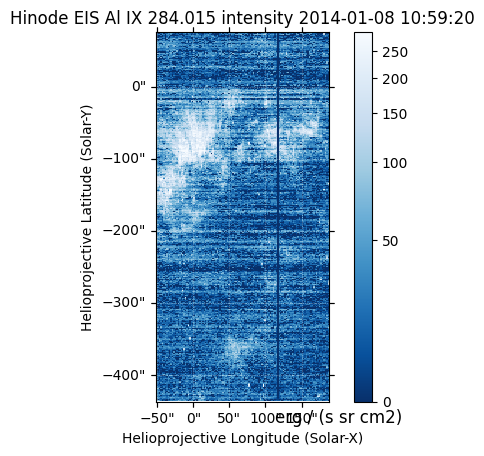

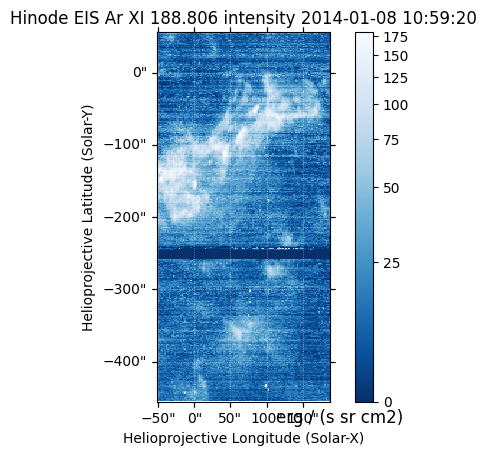

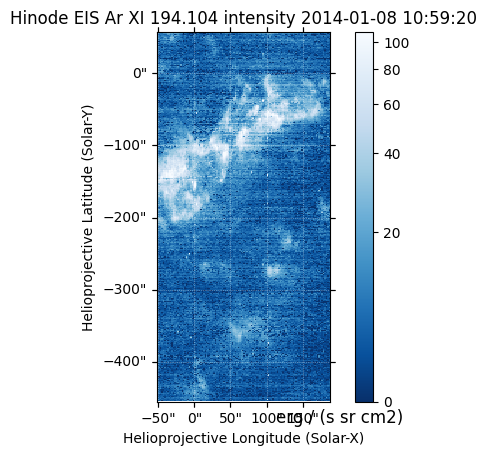

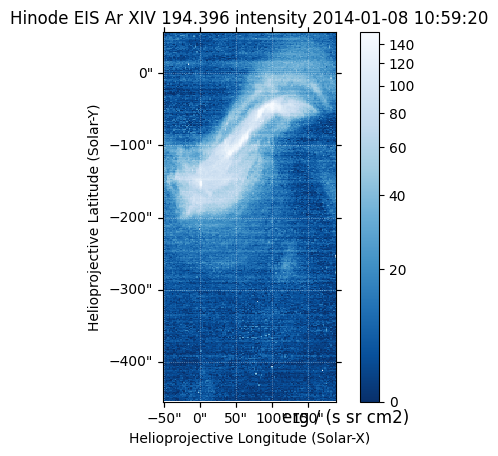

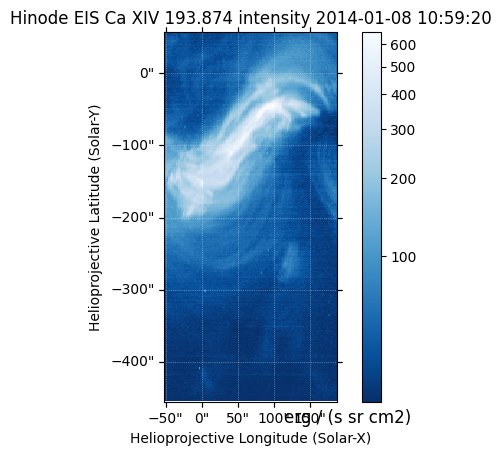

...

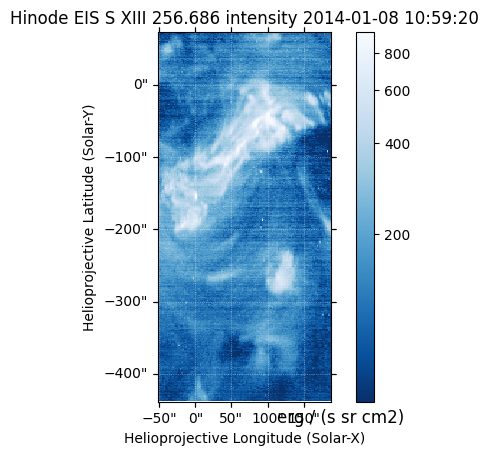

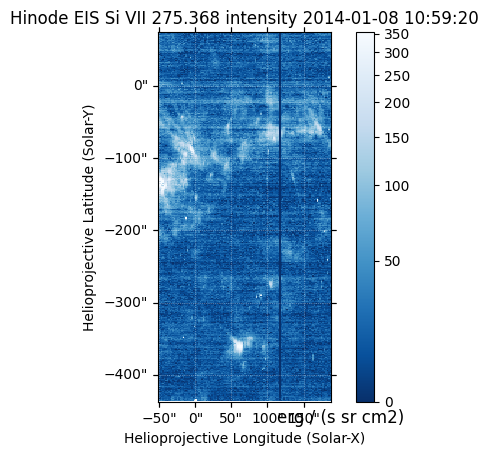

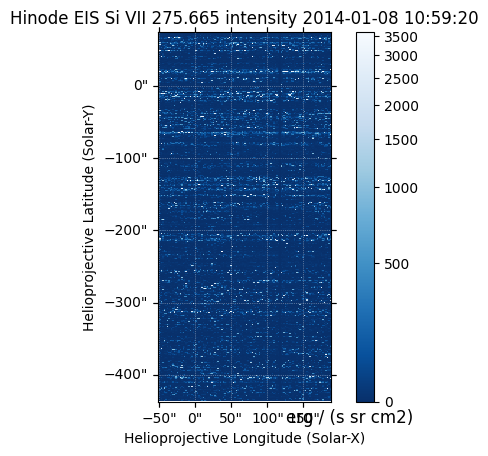

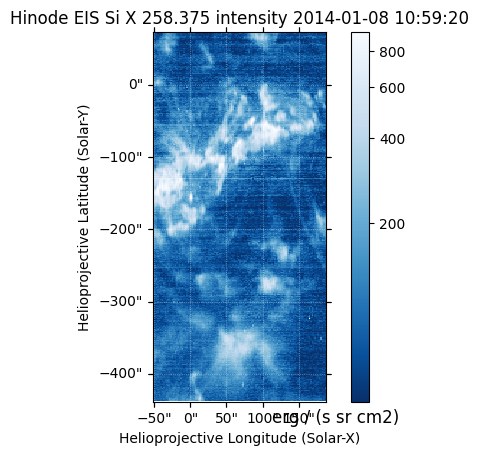

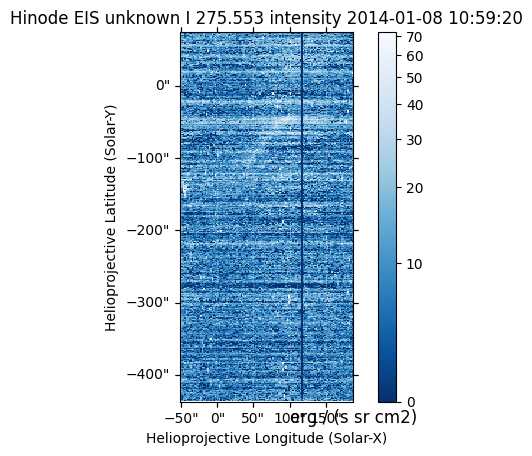

In [19]:
for m in m_11944:
    m.peek(clip_interval=(1,99.9)*u.percent)

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


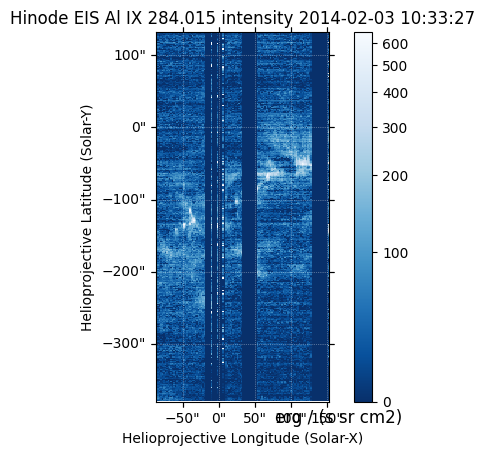

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


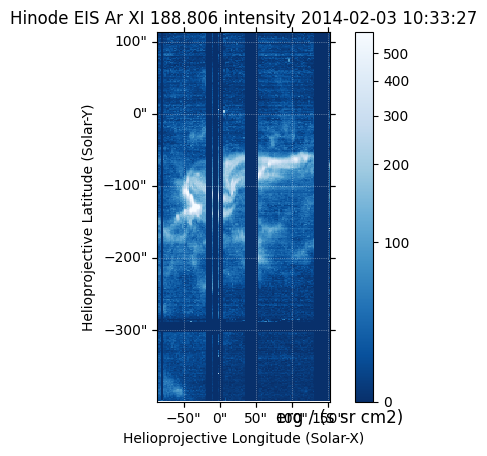

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


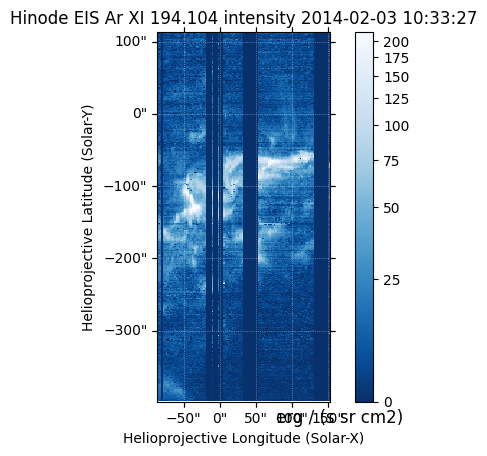

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


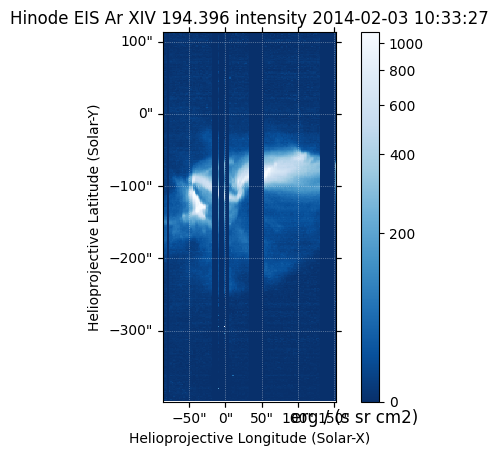

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


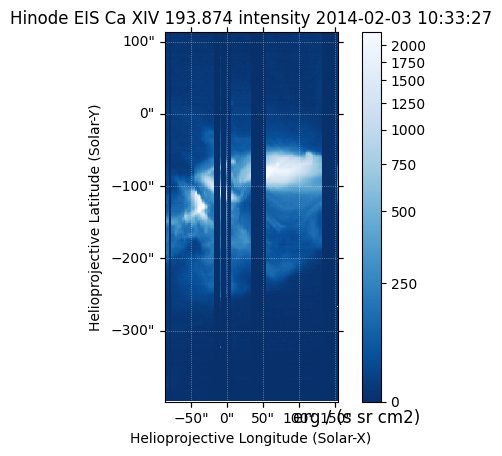

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


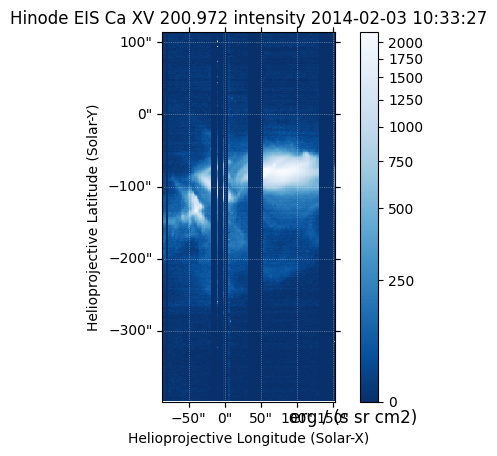

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


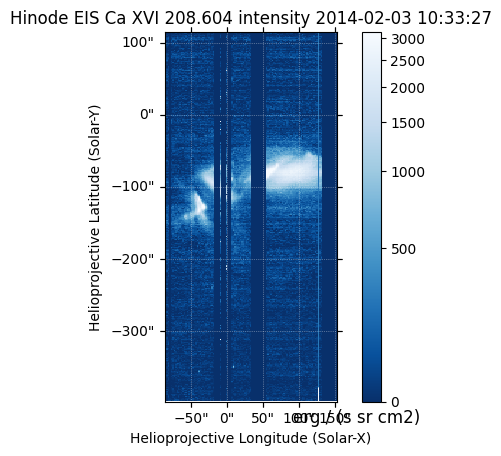

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


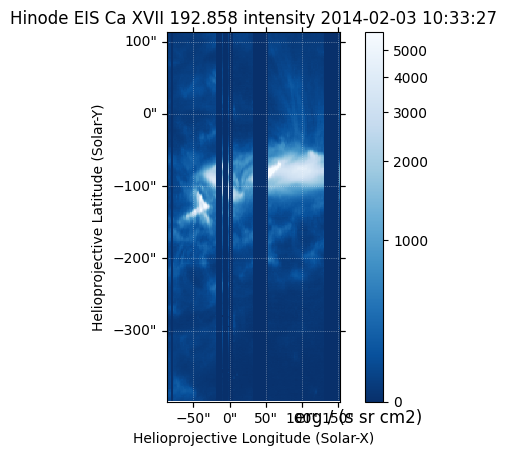

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


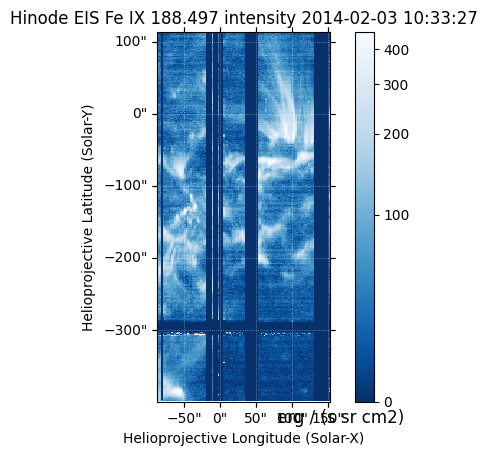

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


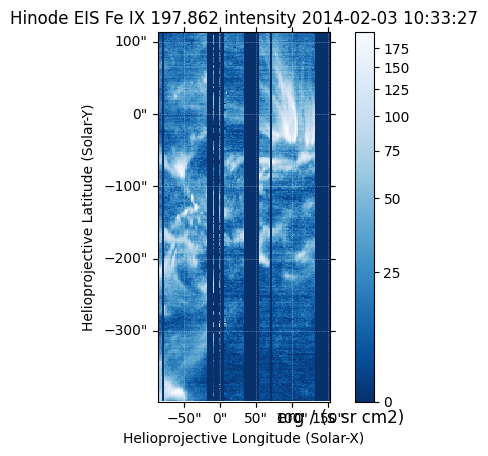

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


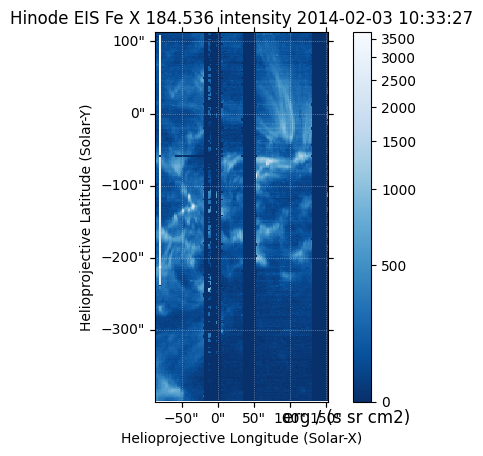

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


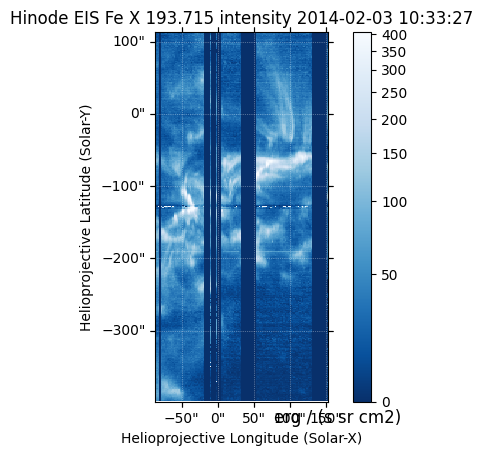

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


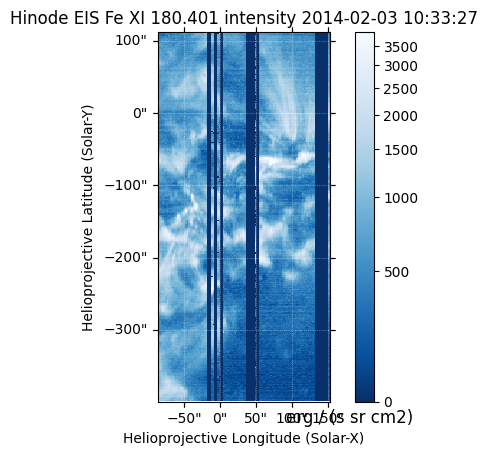

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


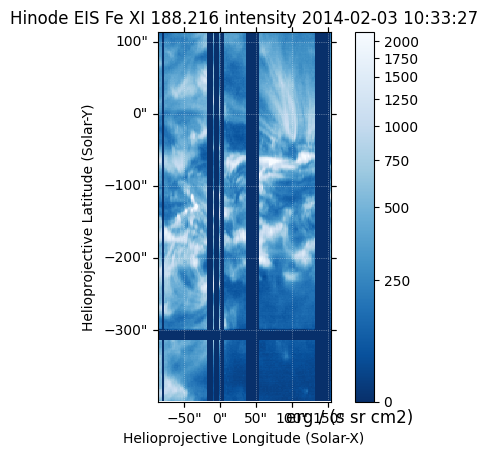

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


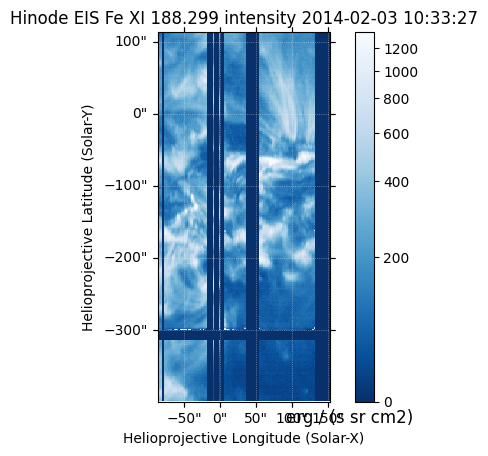

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


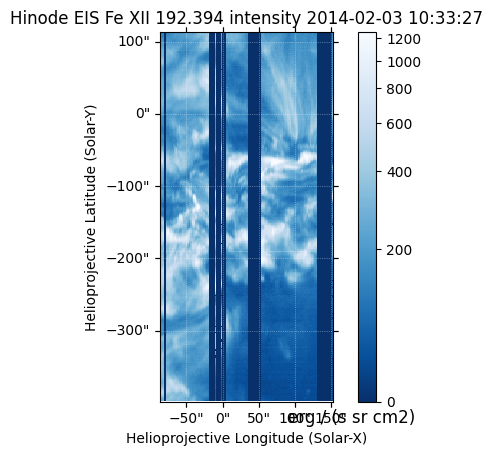

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


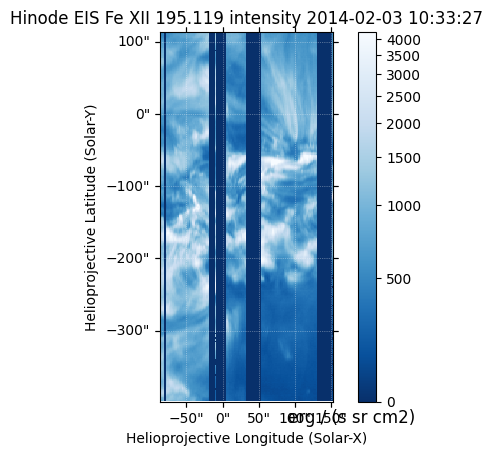

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


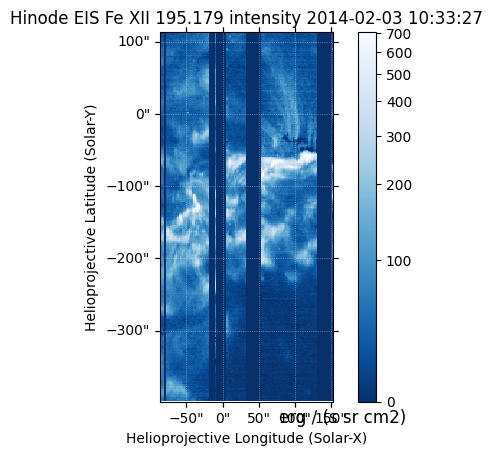

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


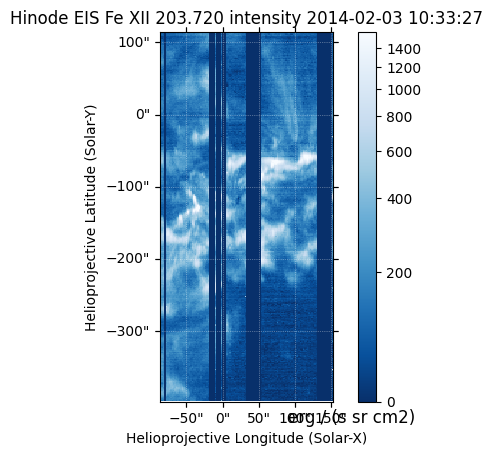

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


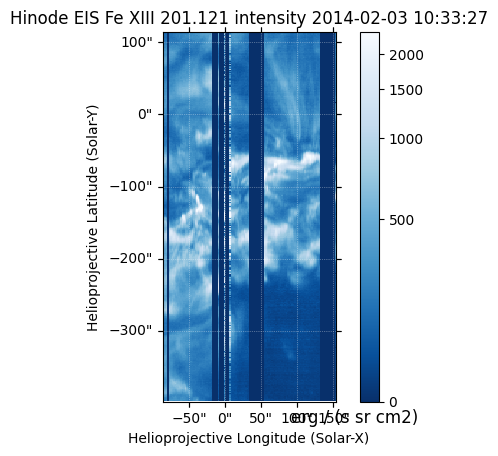

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


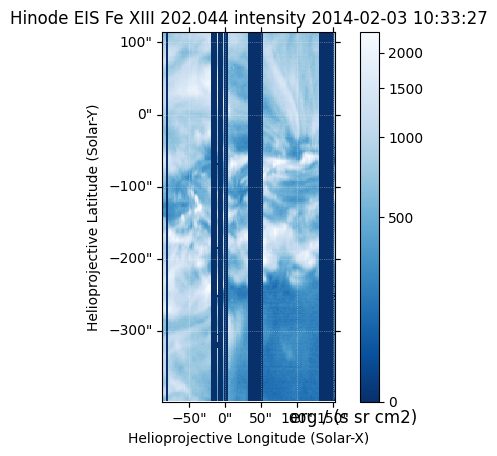

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


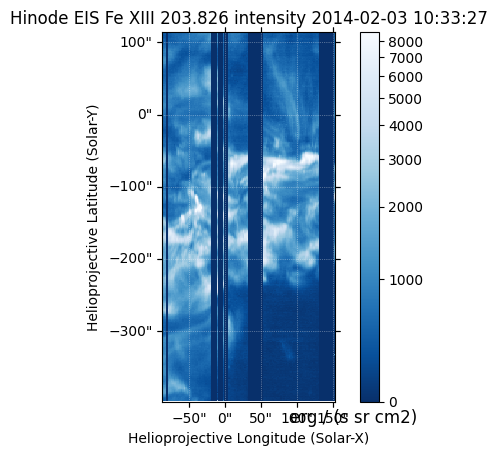

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


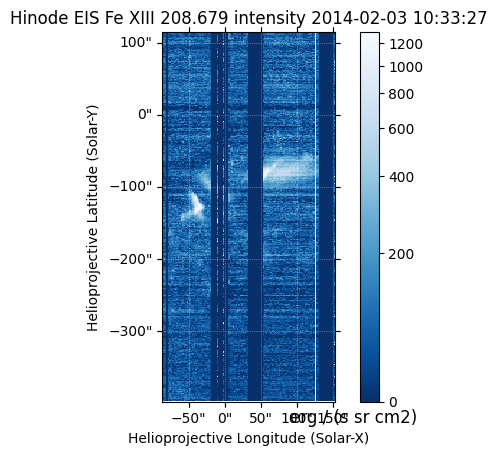

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


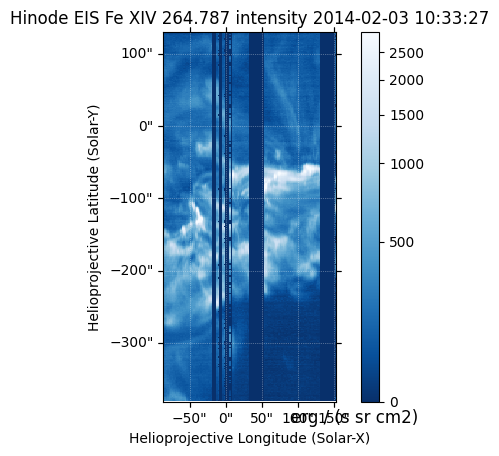

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


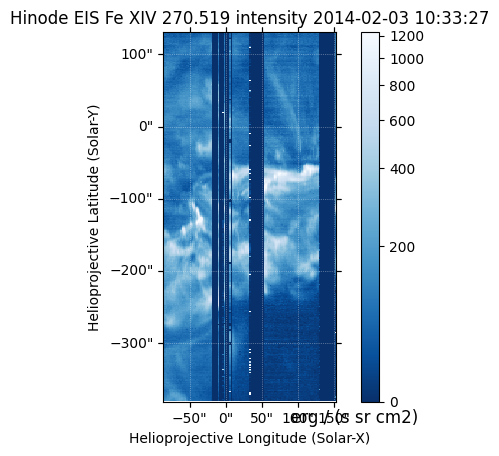

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


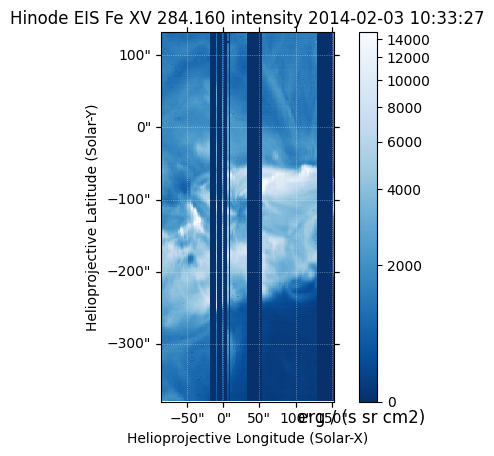

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


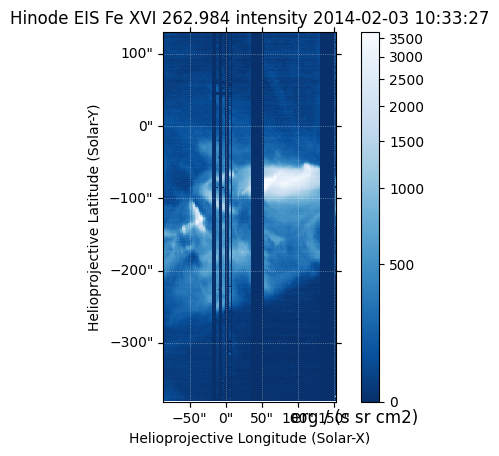

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


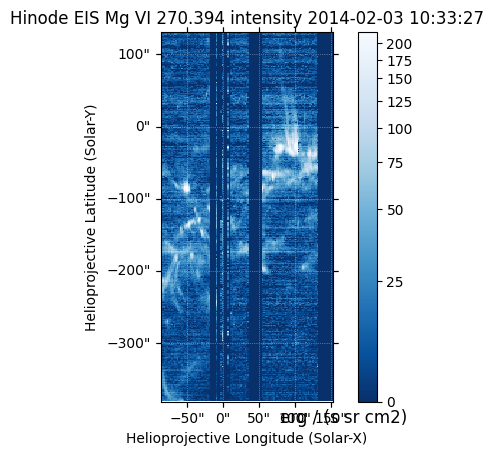

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


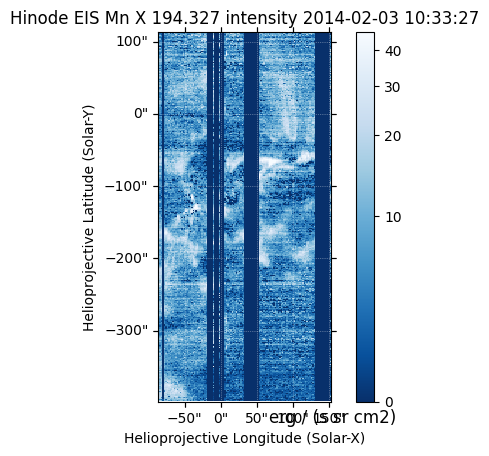

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


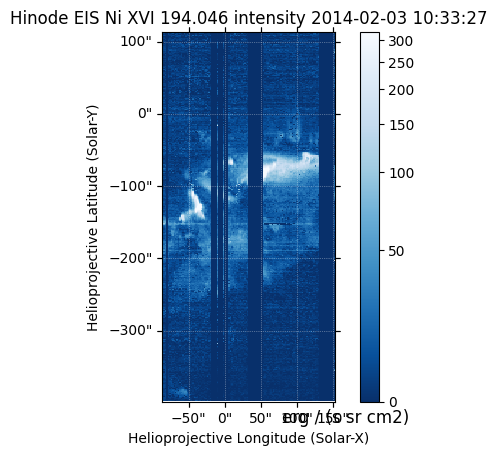

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


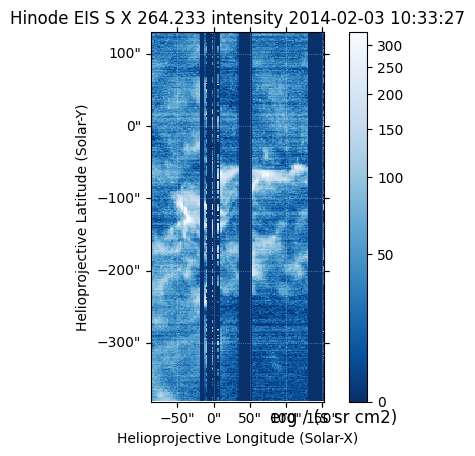

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


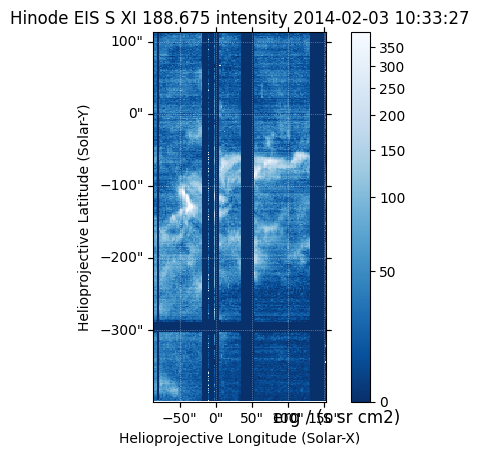

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


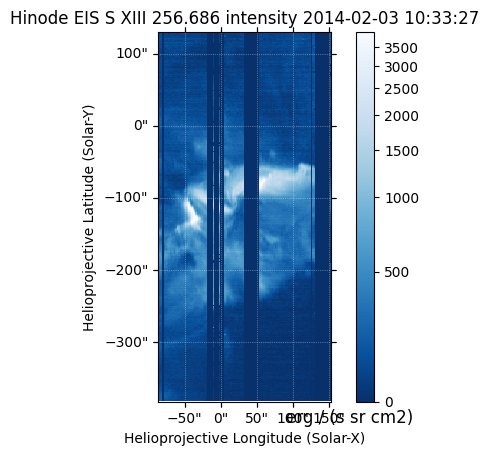

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


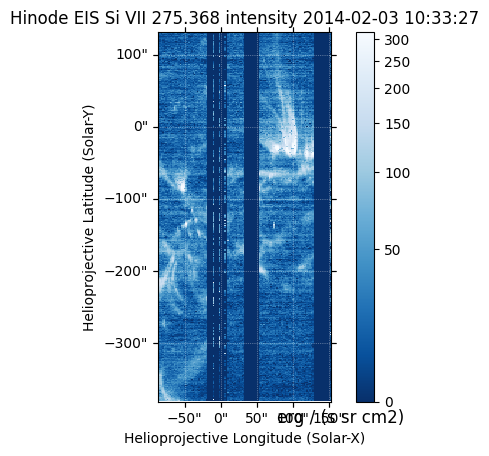

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


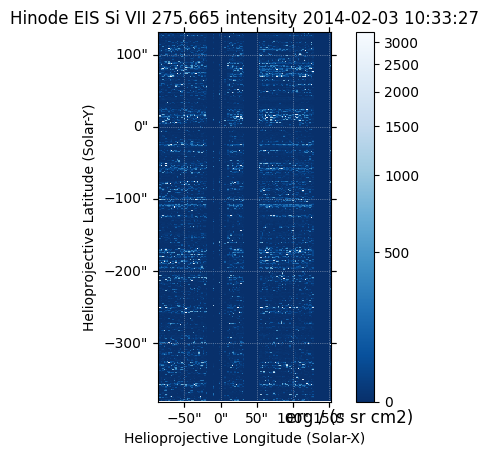

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


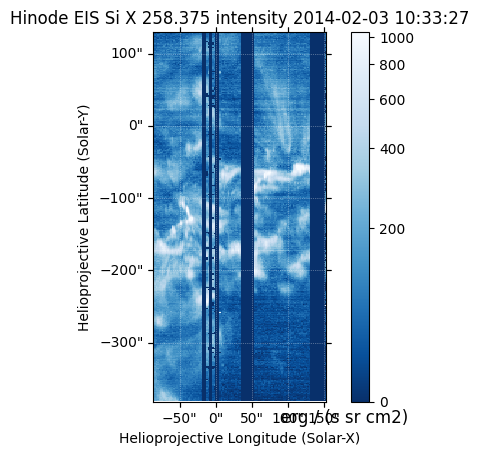

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


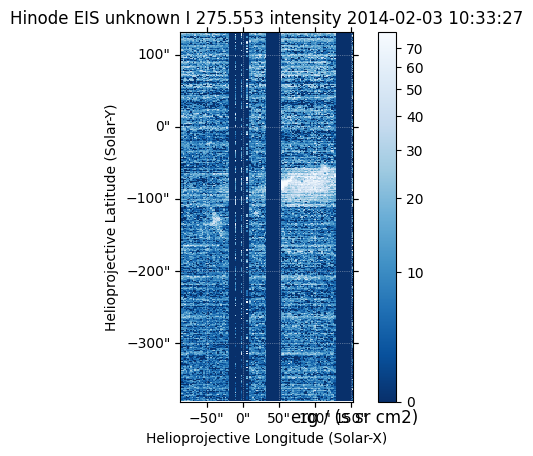

In [21]:
for m in m_11967:
    m.peek(clip_interval=(1,99.9)*u.percent)

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


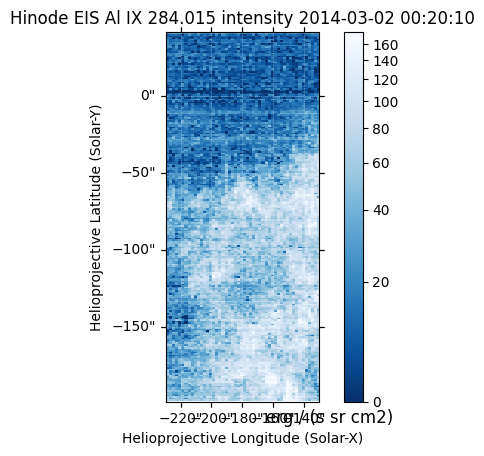

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


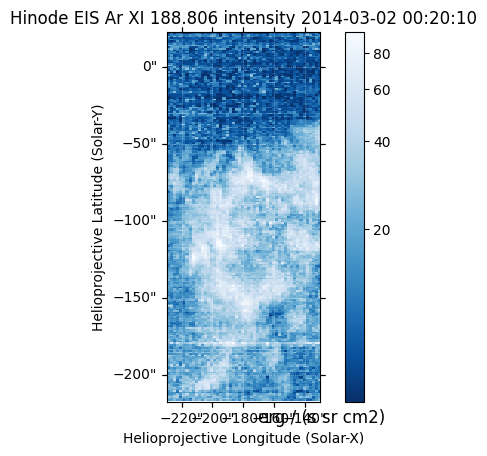

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


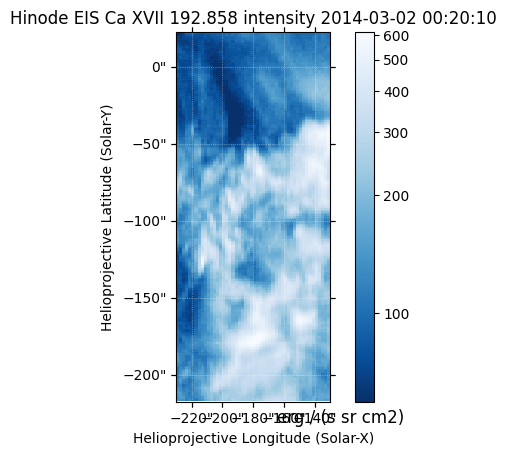

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


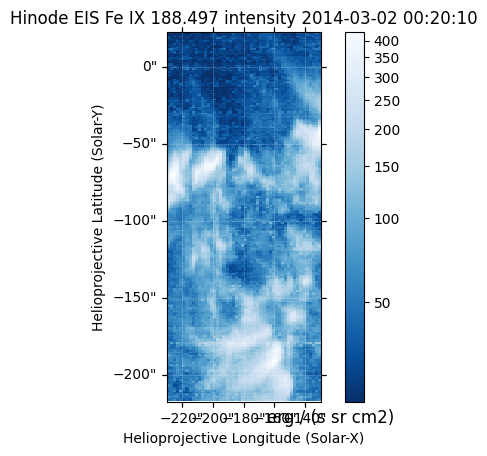

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


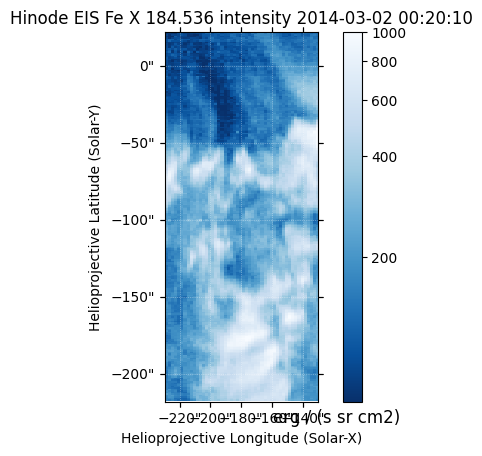

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


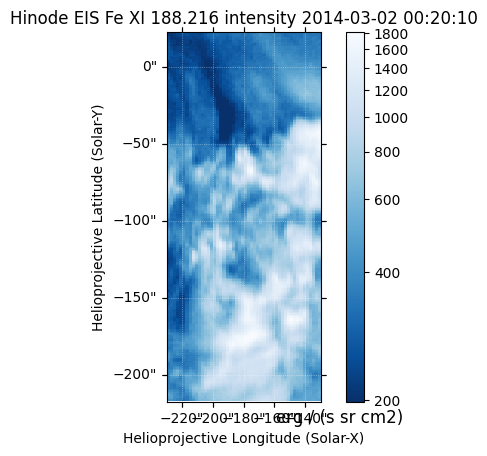

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


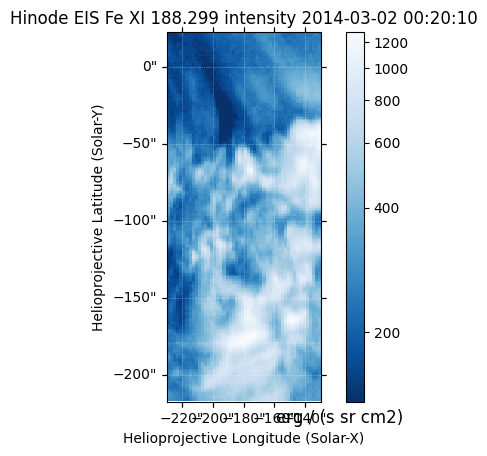

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


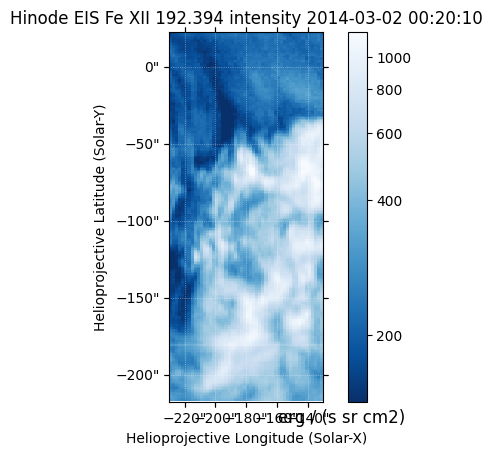

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


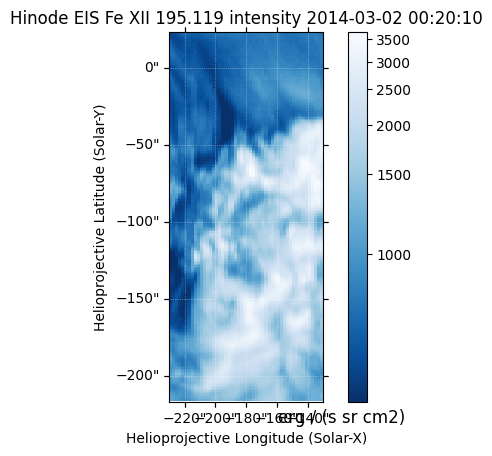

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


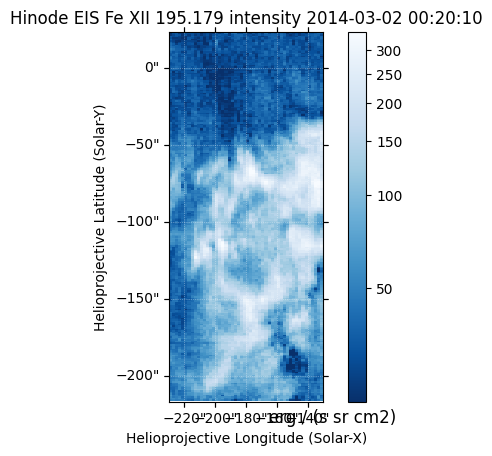

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


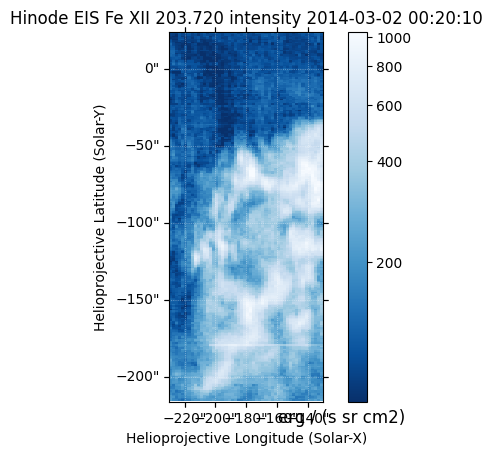

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


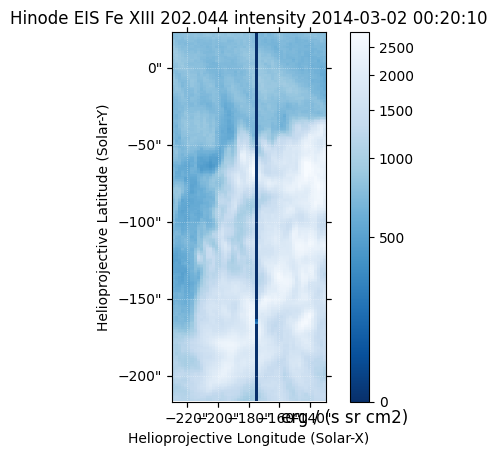

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


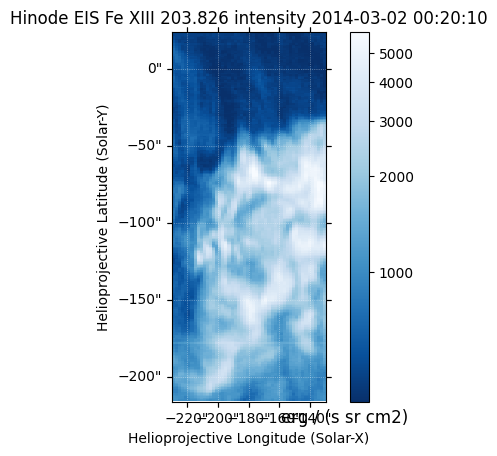

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


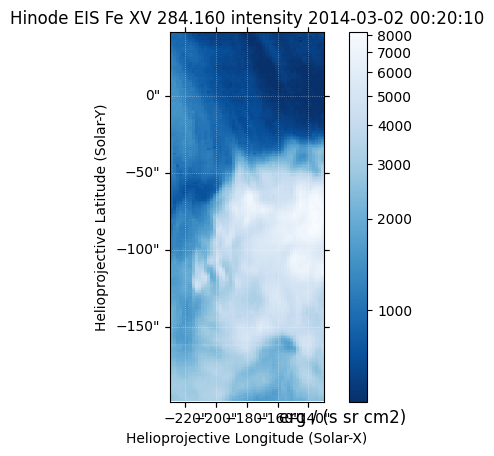

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


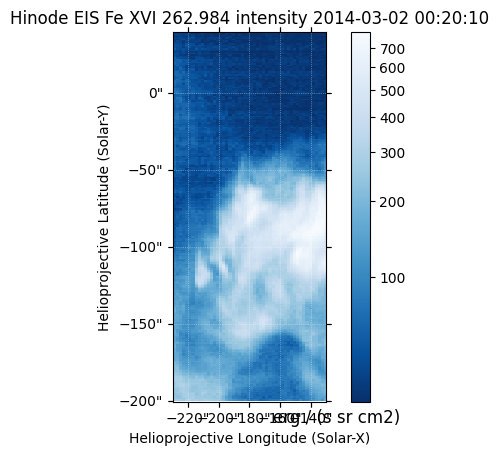

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


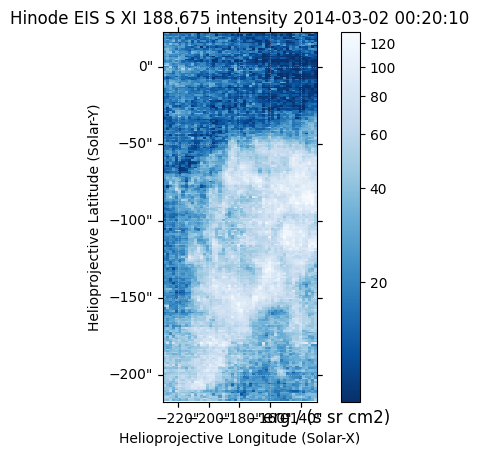

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


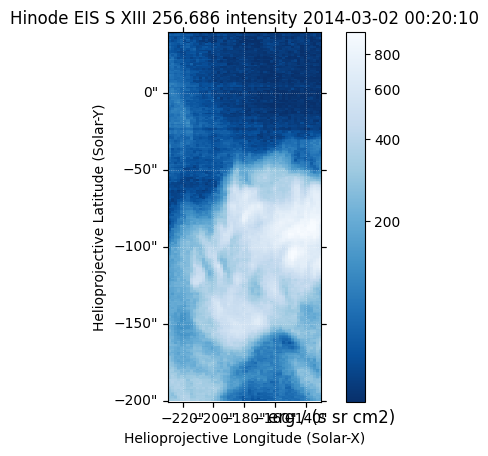

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


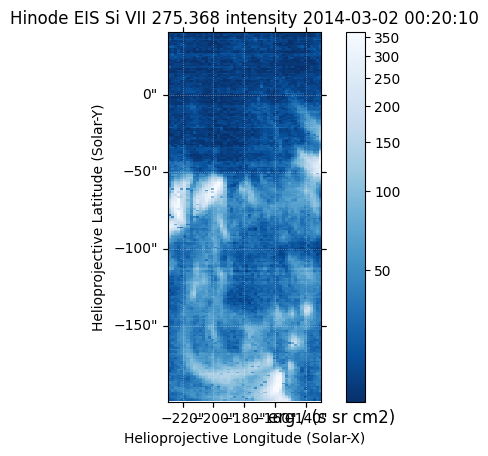

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


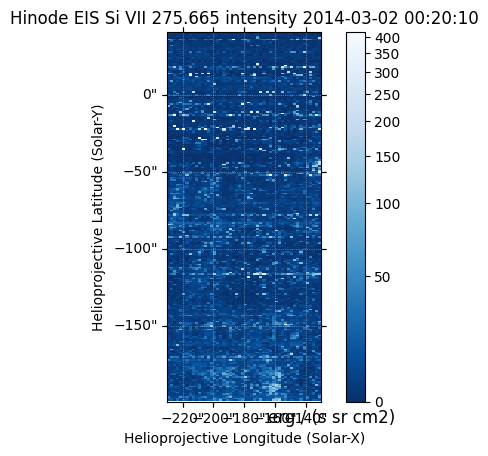

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


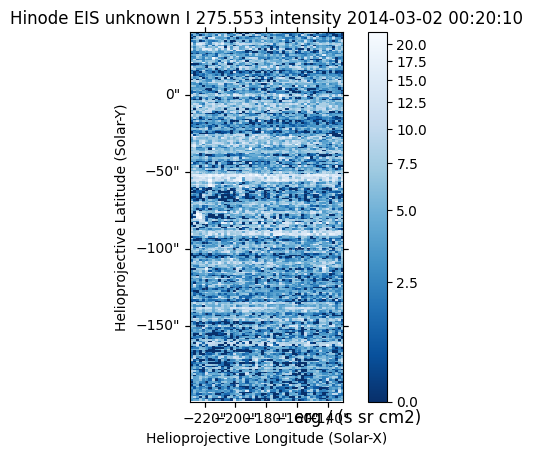

In [23]:
for m in m_11990:
    m.peek(clip_interval=(1,99.9)*u.percent)

In [28]:
fix_eis_pointing('../data/noaa_11944/EIS/level_2/', '../data/noaa_11944/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia_lev1_193a_2014_01_08t10_59_18_84z_image_lev1.fits:   0%|          | 0.00/12.7M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Miss

In [38]:
fix_eis_pointing('../data/noaa_11967/EIS/level_2/', '../data/noaa_11967/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia_lev1_193a_2014_02_03t10_33_30_84z_image_lev1.fits:   0%|          | 0.00/12.6M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Miss

In [39]:
fix_eis_pointing('../data/noaa_11990/EIS/level_2/', '../data/noaa_11990/EIS/level_2.5/')

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia_lev1_193a_2014_03_02t00_20_08_86z_image_lev1.fits:   0%|          | 0.00/10.9M [00:00<?, ?B/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Miss

In [40]:
m_11944_corrected = sunpy.map.Map('../data/noaa_11944/EIS/level_2.5/eis_20140108_095727.*.int.fits')
m_11967_corrected = sunpy.map.Map('../data/noaa_11967/EIS/level_2.5/eis_20140203_093134.*.int.fits')
m_11990_corrected = sunpy.map.Map('../data/noaa_11990/EIS/level_2.5/eis_20140302_000659.*.int.fits')

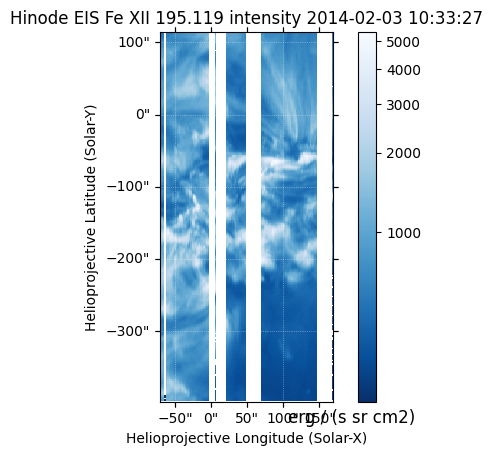

In [43]:
foo = m_11967_corrected[16]
foo.mask = foo.data == 0.0
foo.peek()

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


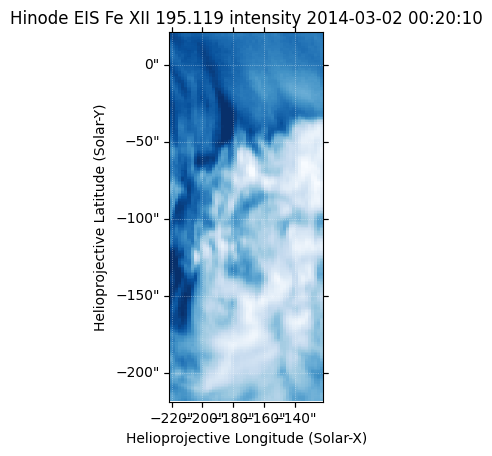

In [48]:
m_11990_corrected[8].plot(clip_interval=(1,99.9)*u.percent)

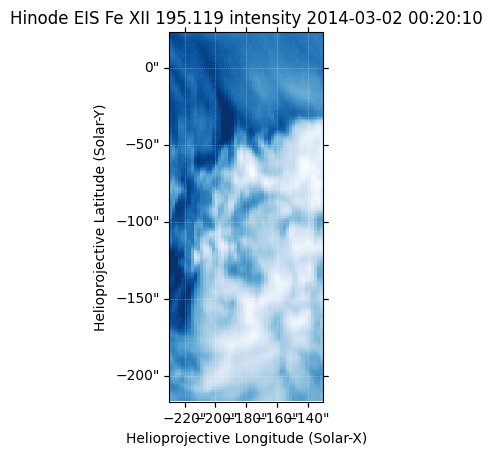

In [49]:
m_11990[8].plot(clip_interval=(1,99.9)*u.percent)

In [50]:
from astropy.coordinates import SkyCoord

Observatory,Hinode
Instrument,EIS
Detector,
Measurement,intensity
Wavelength,195.119 Angstrom
Observation Date,2014-03-02 00:20:10
Exposure Time,Unknown
Dimension,[ 50. 240.] pix
Coordinate System,helioprojective
Scale,[1.9968 1. ] arcsec / pix
Reference Pixel,[0. 0.] pix

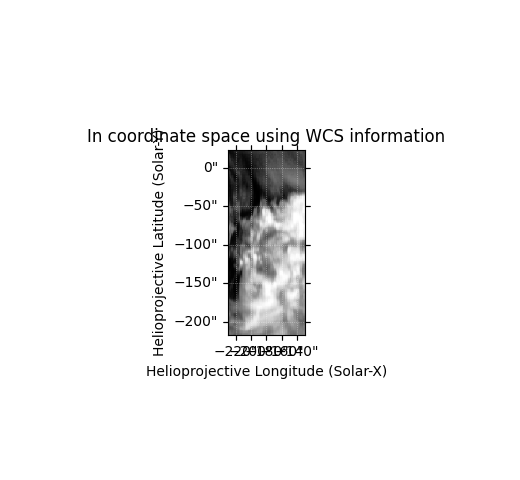
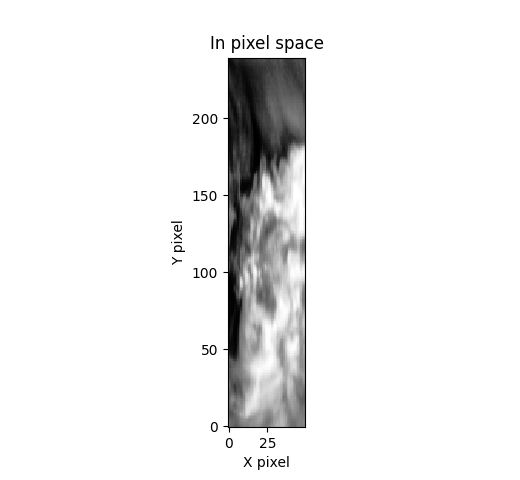
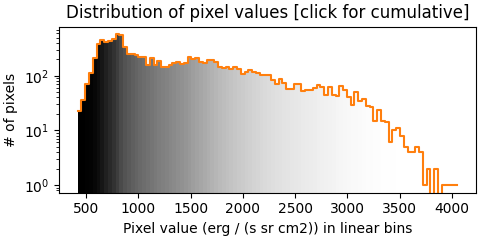
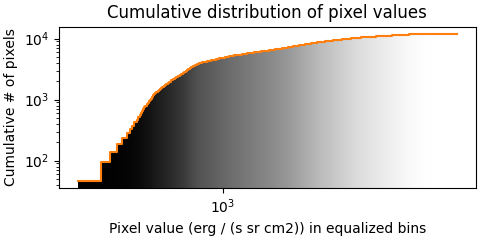

In [51]:
m_11990[8]

In [52]:
SkyCoord(Tx=100,Ty=200,unit='arcsec',frame=m_11990[8].coordinate_frame)

<SkyCoord (Helioprojective: obstime=2014-03-02T00:20:10.500, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2014-03-02T00:20:10.500, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (0., -7.22843736, 1.48255472e+11)>): (Tx, Ty) in arcsec
    (100., 200.)>